# Space Race
 Analyse and Visualise the Space Race

## Modules

In [59]:
#import the Libraries

# standard Libraries
import os
import re
from datetime import datetime, timedelta
import pandas as pd
import numpy as np

# used for displaying data and stuff
from IPython.display import display, HTML 

# used for charts and Graphs
import plotly
import plotly.express as px
import seaborn as sns

In [60]:
# set pandas options
# show all the columns and rows
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)

## loading data

In [61]:
# df will be the original data
df = pd.read_csv('space_missions.csv',encoding='utf-8',encoding_errors='ignore')
#Note: bad character in file ... fixed

display(df.head())
display(df.tail())

,Company,Location,Date,Time,Rocket,Mission,RocketStatus,Price,MissionStatus
0,RVSN USSR,"Site 1/5, Baikonur Cosmodrome, Kazakhstan",1957-10-04,19:28:00,Sputnik 8K71PS,Sputnik-1,Retired,NaN,Success
1,RVSN USSR,"Site 1/5, Baikonur Cosmodrome, Kazakhstan",1957-11-03,02:30:00,Sputnik 8K71PS,Sputnik-2,Retired,NaN,Success
2,US Navy,"LC-18A, Cape Canaveral AFS, Florida, USA",1957-12-06,16:44:00,Vanguard,Vanguard TV3,Retired,NaN,Failure
3,AMBA,"LC-26A, Cape Canaveral AFS, Florida, USA",1958-02-01,03:48:00,Juno I,Explorer 1,Retired,NaN,Success
4,US Navy,"LC-18A, Cape Canaveral AFS, Florida, USA",1958-02-05,07:33:00,Vanguard,Vanguard TV3BU,Retired,NaN,Failure


,Company,Location,Date,Time,Rocket,Mission,RocketStatus,Price,MissionStatus
4625,SpaceX,"SLC-4E, Vandenberg SFB, California, USA",2022-07-22,17:39:00,Falcon 9 Block 5,Starlink Group 3-2,Active,67,Success
4626,CASC,"LC-101, Wenchang Satellite Launch Center, China",2022-07-24,06:22:00,Long March 5B,Wentian,Active,NaN,Success
4627,SpaceX,"LC-39A, Kennedy Space Center, Florida, USA",2022-07-24,13:38:00,Falcon 9 Block 5,Starlink Group 4-25,Active,67,Success
4628,CAS Space,"Jiuquan Satellite Launch Center, China",2022-07-27,04:12:00,Zhongke-1A,Demo Flight,Active,NaN,Success
4629,CASC,"LC-3, Xichang Satellite Launch Center, China",2022-07-29,13:28:00,Long March 2D,Yaogan 35 Group 03,Active,29.75,Success


## add additional columns

In [62]:
dfv1 = df.copy()

dfv1['Price'] = dfv1['Price'].str.replace(',','').astype(float)

dfv1['Country'] = ''
dfv1.loc[ dfv1['Location'].str.contains('USA') , 'Country'] = 'USA' 
dfv1.loc[ dfv1['Location'].str.contains('New Mexico') , 'Country'] = 'USA' #this is an american company
dfv1.loc[ dfv1['Location'].str.contains('China') , 'Country'] = 'China' 
dfv1.loc[ dfv1['Location'].str.contains('Kazakhstan') , 'Country'] = 'Russia/USSR' 
dfv1.loc[ dfv1['Location'].str.contains('Russia') , 'Country'] = 'Russia/USSR' 
dfv1.loc[ dfv1['Location'].str.contains('France') , 'Country'] = 'France' 
dfv1.loc[ dfv1['Location'].str.contains('Japan') , 'Country'] = 'Japan' 
dfv1.loc[ dfv1['Location'].str.contains('Kenya') , 'Country'] = 'Kenya' 
dfv1.loc[ dfv1['Location'].str.contains('Australia') , 'Country'] = 'Australia'
dfv1.loc[ dfv1['Location'].str.contains('India') , 'Country'] = 'India'
dfv1.loc[ dfv1['Location'].str.contains('Israel') , 'Country'] = 'Israel'
dfv1.loc[ dfv1['Location'].str.contains('Brazil') , 'Country'] = 'Brazil'

dfv1.loc[ dfv1['Location'].str.contains('North Korea') , 'Country'] = 'North Korea'
dfv1.loc[ dfv1['Location'].str.contains('South Korea') , 'Country'] = 'South Korea'
dfv1.loc[ dfv1['Location'].str.contains('South Korea') , 'Country'] = 'South Korea'
dfv1.loc[ dfv1['Location'].str.contains('Iran') , 'Country'] = 'Iran'

dfv1.loc[ dfv1['Location'].str.contains('Northrop') , 'Country'] = 'USA' #this is an american company
dfv1.loc[ dfv1['Company'].str.contains('Northrop') , 'Country'] = 'USA' #this is an american company
dfv1.loc[ dfv1['Company'].str.contains('SRC') , 'Country'] = 'USA' #this is an american company
dfv1.loc[ dfv1['Company'].str.contains('Sandia') , 'Country'] = 'USA' #this is an american company
dfv1.loc[ dfv1['Company'].str.contains('Rocket Lab') , 'Country'] = 'USA' #this is an american company

dfv1.loc[ dfv1['Company'].str.contains('CASC') , 'Country'] = 'China' #this is an china company

dfv1.loc[ dfv1['Company'].str.contains('IRGC') , 'Country'] = 'China' #this is an Iran company

dfv1.loc[ dfv1['Company'].str.contains('Sea Launch') , 'Country'] = 'multinational' #this is an multinational company

# chack to make sure i got them all 
print('Blank Country',len(dfv1[dfv1['Country'] == '']))
dfv1[dfv1['Country'] == ''].head(100)

Blank Country 0


,Company,Location,Date,Time,Rocket,Mission,RocketStatus,Price,MissionStatus,Country


In [63]:
# lets get the year... we'll group by this later
dfv1['YYYY'] = pd.to_datetime(dfv1['Date']).dt.strftime("%Y") 

dfv1['Decade'] = dfv1['YYYY'].str[:3] + '0'

In [64]:
# Mission Status as ints ... easier grouping later 
dfv1['Success_int'] = 0
dfv1['Failure_int'] = 0
dfv1['MissionStatus_int'] = -1

dfv1.loc[ dfv1['MissionStatus'].str.contains('Success') , 'Success_int'] = 1
dfv1.loc[ dfv1['MissionStatus'].str.contains('Success') , 'MissionStatus_int'] = 1
dfv1.loc[ dfv1['MissionStatus'].str.contains('Failure') , 'Failure_int'] = 1

In [65]:
display(dfv1.head())
display(dfv1.tail())

,Company,Location,Date,Time,Rocket,Mission,RocketStatus,Price,MissionStatus,Country,YYYY,Decade,Success_int,Failure_int,MissionStatus_int
0,RVSN USSR,"Site 1/5, Baikonur Cosmodrome, Kazakhstan",1957-10-04,19:28:00,Sputnik 8K71PS,Sputnik-1,Retired,NaN,Success,Russia/USSR,1957,1950,1,0,1
1,RVSN USSR,"Site 1/5, Baikonur Cosmodrome, Kazakhstan",1957-11-03,02:30:00,Sputnik 8K71PS,Sputnik-2,Retired,NaN,Success,Russia/USSR,1957,1950,1,0,1
2,US Navy,"LC-18A, Cape Canaveral AFS, Florida, USA",1957-12-06,16:44:00,Vanguard,Vanguard TV3,Retired,NaN,Failure,USA,1957,1950,0,1,-1
3,AMBA,"LC-26A, Cape Canaveral AFS, Florida, USA",1958-02-01,03:48:00,Juno I,Explorer 1,Retired,NaN,Success,USA,1958,1950,1,0,1
4,US Navy,"LC-18A, Cape Canaveral AFS, Florida, USA",1958-02-05,07:33:00,Vanguard,Vanguard TV3BU,Retired,NaN,Failure,USA,1958,1950,0,1,-1


,Company,Location,Date,Time,Rocket,Mission,RocketStatus,Price,MissionStatus,Country,YYYY,Decade,Success_int,Failure_int,MissionStatus_int
4625,SpaceX,"SLC-4E, Vandenberg SFB, California, USA",2022-07-22,17:39:00,Falcon 9 Block 5,Starlink Group 3-2,Active,67.00,Success,USA,2022,2020,1,0,1
4626,CASC,"LC-101, Wenchang Satellite Launch Center, China",2022-07-24,06:22:00,Long March 5B,Wentian,Active,NaN,Success,China,2022,2020,1,0,1
4627,SpaceX,"LC-39A, Kennedy Space Center, Florida, USA",2022-07-24,13:38:00,Falcon 9 Block 5,Starlink Group 4-25,Active,67.00,Success,USA,2022,2020,1,0,1
4628,CAS Space,"Jiuquan Satellite Launch Center, China",2022-07-27,04:12:00,Zhongke-1A,Demo Flight,Active,NaN,Success,China,2022,2020,1,0,1
4629,CASC,"LC-3, Xichang Satellite Launch Center, China",2022-07-29,13:28:00,Long March 2D,Yaogan 35 Group 03,Active,29.75,Success,China,2022,2020,1,0,1


## Success Rate per Decade, groupby Country
> note: sum is not that helpful... but it shows the leaders rather well

In [66]:
SRPD =  dfv1.copy()

SRPD = pd.pivot_table(
        SRPD,
        values = ['Success_int','Failure_int'],
        index = ['Decade','Country'],
        aggfunc = {
            'Success_int': sum,
            'Failure_int': sum,
            }
        )

SRPD['Rate'] = SRPD['Success_int']/(SRPD['Success_int'] + SRPD['Failure_int'])
SRPD = SRPD.reset_index()

SRPD = pd.pivot_table(
        SRPD,
        values = 'Rate',
        index = 'Decade',
        columns = 'Country',
        aggfunc = {
            'Rate': sum,
            }
        )


sums = {}
for c in SRPD.columns:
    if c == 'Country':
        sums['Country'] = 'GrandTotal'
    else:
        sums[c] = SRPD[c].sum()

# print(sums)
sums = pd.DataFrame(sums,index=[-1])

# display(sums)
SRPD = pd.concat([SRPD,sums])

SRPD = SRPD.sort_values(SRPD.last_valid_index(), axis=1,ascending=False)
SRPD = SRPD.reset_index()
SRPD.rename(columns = {'index':'Decade'}, inplace = True)
SRPD.loc[ SRPD['Decade'] == -1,'Decade'] = 'Sum' 

cm = sns.color_palette('RdYlGn', as_cmap=True)
display(SRPD.style.background_gradient(cmap=cm))


,Decade,Russia/USSR,USA,France,Japan,China,Israel,India,Kenya,multinational,Iran,Australia,South Korea,North Korea,Brazil
0,1950,0.454545,0.275000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
1,1960,0.809955,0.777429,0.750000,0.000000,0.000000,nan,nan,1.000000,nan,nan,0.666667,nan,nan,nan
2,1970,0.942331,0.909091,0.700000,0.823529,0.687500,nan,0.000000,1.000000,nan,nan,0.333333,nan,nan,nan
3,1980,0.951835,0.913793,0.878788,1.000000,0.933333,1.000000,0.333333,1.000000,nan,nan,nan,nan,nan,nan
4,1990,0.936170,0.927586,0.945055,0.850000,0.846154,0.666667,0.666667,nan,1.000000,nan,nan,nan,0.000000,0.000000
5,2000,0.913580,0.954315,0.970588,0.909091,0.963636,0.666667,0.812500,nan,0.928571,0.500000,nan,0.000000,0.000000,0.000000
6,2010,0.929825,0.953782,0.968421,0.972973,0.942149,1.000000,0.936170,nan,0.833333,0.300000,nan,0.500000,0.666667,nan
7,2020,0.958333,0.913580,0.941176,1.000000,0.934959,1.000000,0.833333,nan,nan,0.333333,nan,0.500000,nan,nan
8,Sum,6.896575,6.624576,6.154029,5.555593,5.307732,4.333333,3.582004,3.000000,2.761905,1.133333,1.000000,1.000000,0.666667,0.000000


## Missions OverTime 
* +1 for successful missions
* -1 for failed missions)

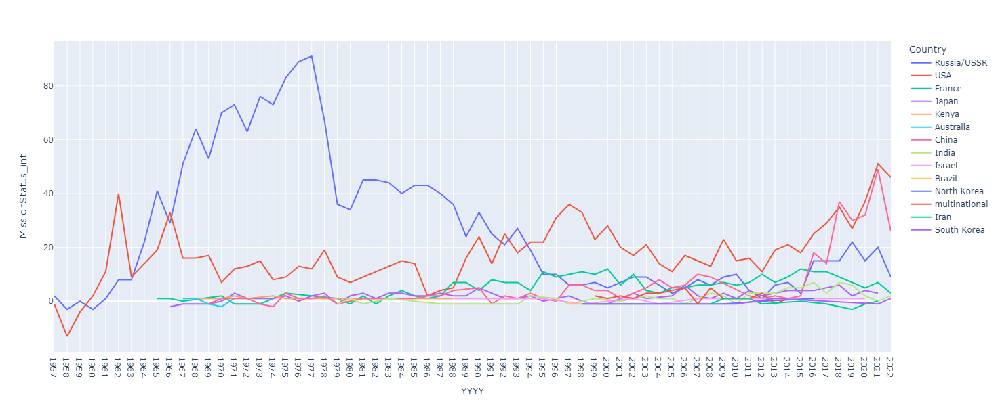

In [67]:
MOT =  dfv1.copy()

MOT = pd.pivot_table(
        MOT,
        values = 'MissionStatus_int',
        index = ['YYYY','Country'],
        aggfunc = {
            'MissionStatus_int': sum
            }
        )

# MOT['Rate'] = MOT['Success_int']/(MOT['Success_int'] + MOT['Failure_int'])
# MOT['Failure_int'] = MOT['Failure_int'] * -1

MOT = MOT.reset_index()
MOT = MOT.sort_values(by='YYYY')

fig = px.line(
    MOT, 
    x='YYYY', 
    y='MissionStatus_int',
    color='Country',
    height=600
    )
fig.show()

## Histogram Chart (Price)

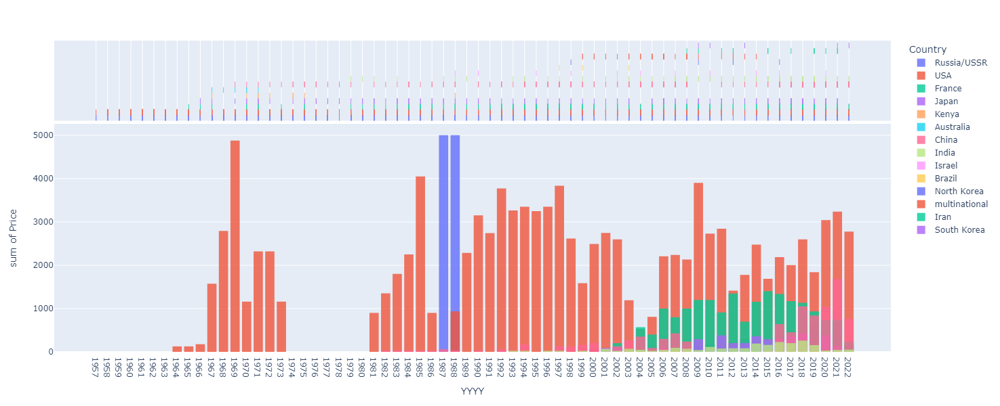

In [68]:
fig = px.histogram(
    dfv1, 
    x='YYYY', 
    y = "Price",
    color='Country',
    marginal="rug",
    hover_data=df.columns,
    height=600
    )
fig.update_layout(barmode='overlay')
fig.update_traces(opacity=0.80)
fig.show()

## Histogram Chart 
MissionStatus_int
* +1 successful missions
* -1 failed missions

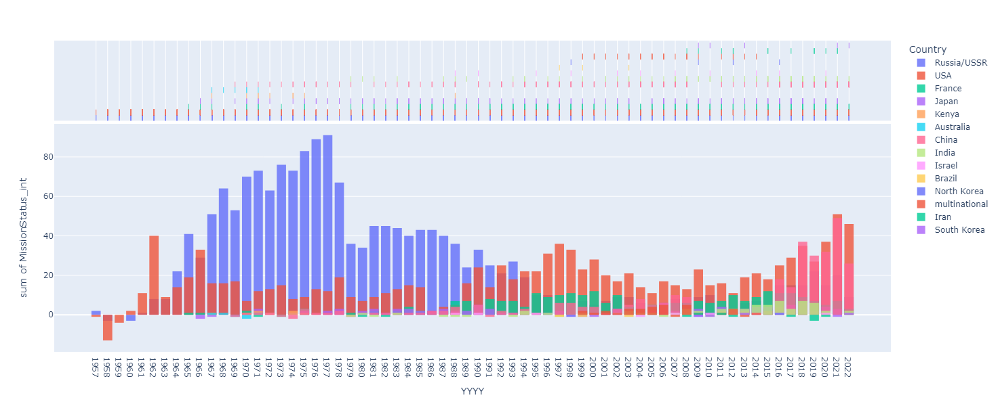

In [69]:
fig = px.histogram(
    dfv1, 
    x='YYYY', 
    y = "MissionStatus_int",
    color='Country',
    marginal="rug",
    hover_data=df.columns,
    height=600
    )
fig.update_layout(barmode='overlay')
fig.update_traces(opacity=0.80)
fig.show()

## Histogram Chart 
By Rocket and the count of each mission

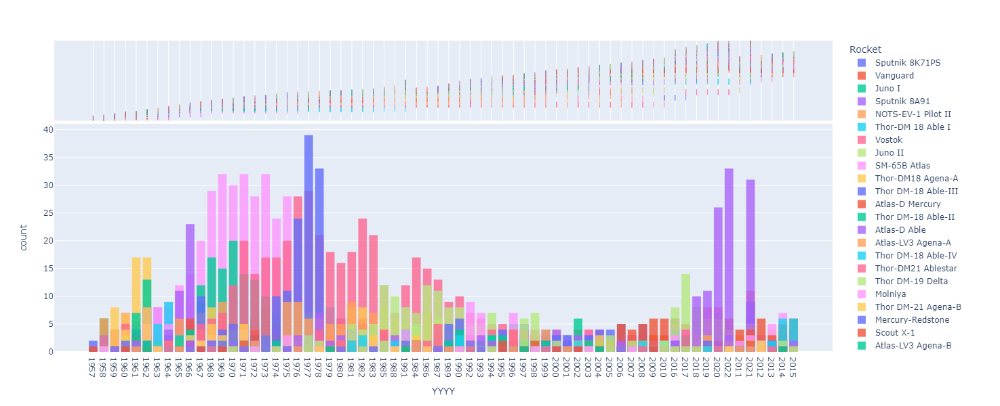

In [70]:
fig = px.histogram(
    dfv1, 
    x='YYYY', 
    # y = Count ... by default
    color='Rocket',
    marginal="rug",
    hover_data=df.columns,
    height=600
    )
fig.update_layout(barmode='overlay')
fig.update_traces(opacity=0.80)
fig.show()

## Histogram Chart 
By Company and the count of each mission

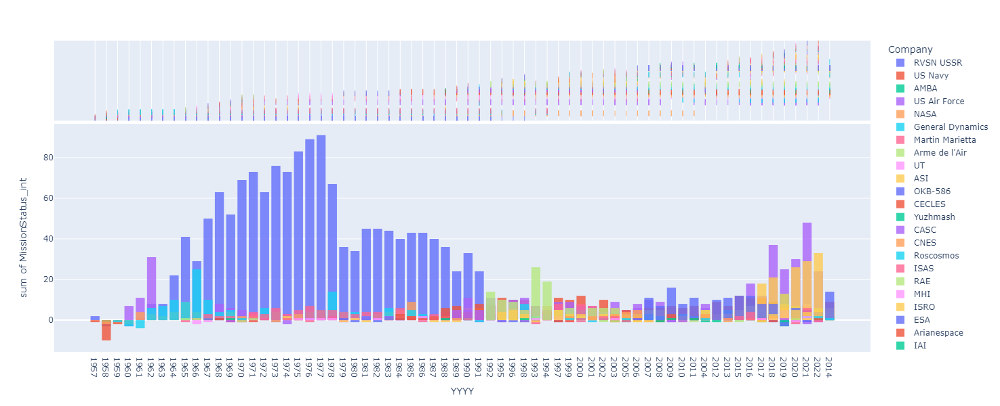

In [72]:
fig = px.histogram(
    dfv1, 
    x='YYYY', 
    y = "MissionStatus_int",
    color='Company',
    marginal="rug",
    hover_data=df.columns,
    height=600
    )
fig.update_layout(barmode='overlay')
fig.update_traces(opacity=0.80)
fig.show()

## Sunburst

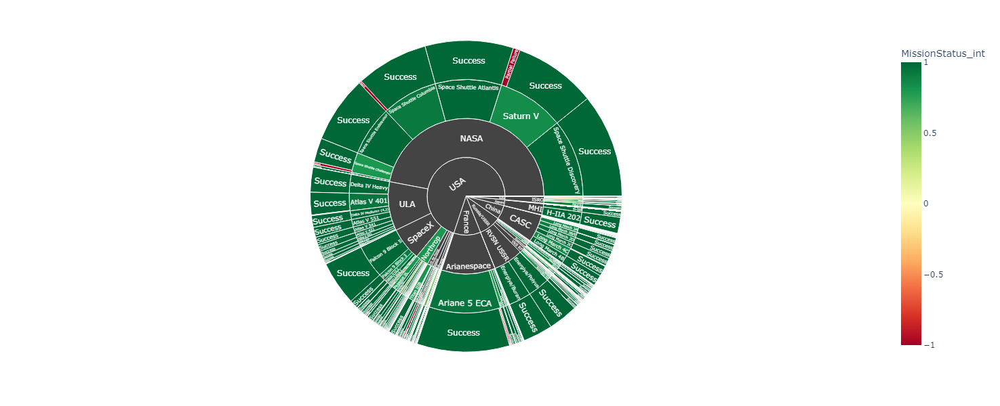

In [71]:
fig = px.sunburst(
    dfv1,
    path=['Country','Company','Rocket','MissionStatus'],
    values="Price",
    color="MissionStatus_int",
    color_continuous_scale='RdYlGn',
    height=600
)
fig.show()